# Modified and balanced FX carry

This notebook serves as an illustration of the points discussed in the post ["This notebook serves as an illustration of the points discussed in the post ["Modified and balanced FX carry"](https://research.macrosynergy.com/modified-and-balanced-fx-carry/) available on the Macrosynergy website. 

The post demonstrates two simple ways to enhance FX carry strategies with economic information. The first way increases or reduces the carry signal depending on whether relevant economic indicators reinforce or contradict its direction. The output can be called “modified carry”. It is a gentle adjustment that leaves the basic characteristics of the original carry strategy intact. The second method equalizes the influence of carry and economic indicators, thus diversifying over signals with complementary strengths. The combined signal can be called “balanced carry”. An empirical analysis of carry modification and balancing with economic performance indicators for 26 countries since 2000 suggests that both adjustments would have greatly improved the performance of vol-targeted carry strategies. Modified carry would also have improved the performance of hedged FX carry strategies.

This notebook provides the essential code required to replicate the analysis discussed in the post. 

## Get packages and JPMaQS data

This notebook primarily relies on the standard packages available in the Python data science stack. However, there is an additional package `macrosynergy` that is required for two purposes:

- Downloading JPMaQS data: The `macrosynergy` package facilitates the retrieval of JPMaQS data, which is used in the notebook.

- For the analysis of quantamental data and value propositions: The `macrosynergy` package provides functionality for performing quick analyses of quantamental data and exploring value propositions.

For detailed information and a comprehensive understanding of the `macrosynergy` package and its functionalities, please refer to the [“Introduction to Macrosynergy package”](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php) notebook on the Macrosynergy Quantamental Academy or visit the following link on [Kaggle](https://www.kaggle.com/code/macrosynergy/introduction-to-macrosynergy-package).

In [1]:
# Run only if needed!
# !pip install macrosynergy --upgrade

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math
import seaborn as sns
import os

import macrosynergy.management as msm
import macrosynergy.panel as msp
import macrosynergy.signal as mss
import macrosynergy.pnl as msn

from macrosynergy.download import JPMaQSDownload


import warnings

warnings.simplefilter("ignore")

The JPMaQS indicators we consider are downloaded using the J.P. Morgan Dataquery API interface within the `macrosynergy` package. This is done by specifying ticker strings, formed by appending an indicator category code <category> to a currency area code <cross_section>. These constitute the main part of a full quantamental indicator ticker, taking the form `DB(JPMAQS,<cross_section>_<category>,<info>)`, where <info> denotes the time series of information for the given cross-section and category. The following types of information are available:

`value` giving the latest available values for the indicator
`eop_lag` referring to days elapsed since the end of the observation period
`mop_lag` referring to the number of days elapsed since the mean observation period
`grade` denoting a grade of the observation, giving a metric of real-time information quality.

After instantiating the `JPMaQSDownload` class within the `macrosynergy.download` module, one can use the `download(tickers,start_date,metrics)` method to easily download the necessary data, where `tickers` is an array of ticker strings, `start_date` is the first collection date to be considered and `metrics` is an array comprising the times series information to be downloaded. For more information see [here](https://github.com/macrosynergy/macrosynergy/blob/develop/README.md).



In [3]:
# Cross-sections

cids_dmlc = ["EUR", "JPY", "USD"]  # DM large currency areas
cids_dmsc = ["AUD", "CAD", "CHF", "GBP", "NOK", "NZD", "SEK"]  # DM small currency areas
cids_latm = ["BRL", "COP", "CLP", "MXN", "PEN"]  # Latam
cids_emea = ["CZK", "HUF", "ILS", "PLN", "RON", "RUB", "TRY", "ZAR"]  # EMEA
cids_emas = ["IDR", "INR", "KRW", "MYR", "PHP", "THB", "TWD"]  # EM Asia flex
cids_apeg = ["CNY", "HKD", "SGD"]  # EM Asia peg

cids = cids_dmlc + cids_dmsc + cids_latm + cids_emea + cids_emas

cids_fx = ["JPY"] + cids_dmsc + cids_latm + cids_emea + cids_emas
cids_fxx = list(set(cids_fx) - set(["IDR", "INR"]))
cids_dmfx = ["JPY"] + cids_dmsc
cids_emfx = list(set(cids_fx) - set(cids_dmfx))

cids_eur = ["CHF", "CZK", "HUF", "NOK", "PLN", "RON", "SEK"]  # trading against EUR
cids_eus = ["GBP", "RUB", "TRY"]  # trading against EUR and USD
cids_eud = ["GBP", "RUB", "TRY"]  # trading against EUR and USD
cids_usd = list(set(cids_fx) - set(cids_eur + cids_eus))  # trading against USD

JPMaQS indicators are conveniently grouped into 6 main categories: Economic Trends, Macroeconomic balance sheets, Financial conditions, Shocks and risk measures, Stylized trading factors, and Generic returns. Each indicator has a separate page with notes, description, availability, statistical measures, and timelines for main currencies. The description of each JPMaQS category is available under [Macro quantamental academy](https://academy.macrosynergy.com/quantamental-indicators/). For tickers used in this notebook see [External ratios trends](https://academy.macrosynergy.com/academy/Themes/Economic%20trends/_build/html/notebooks/External%20ratios%20trends.php), [External balance ratios](https://academy.macrosynergy.com/academy/Themes/Macroeconomic%20balance%20sheets/_build/html/notebooks/External%20balance%20ratios.php?highlight=cabgdpratio), [International investment position](https://academy.macrosynergy.com/academy/Themes/Macroeconomic%20balance%20sheets/_build/html/notebooks/International%20investment%20position.php?highlight=niipgdp), [Intuitive growth estimates](https://macrosynergy.com/academy/notebooks/intuitive-gdp-growth-estimates/), [FX forward carry](https://academy.macrosynergy.com/academy/Themes/Stylized%20trading%20factors/_build/html/notebooks/FX%20forward%20carry.php), [Industrial production trends](https://academy.macrosynergy.com/academy/Themes/Economic%20trends/_build/html/notebooks/Industrial%20production%20trends.php?highlight=ip_sa), [Labor market dynamics](https://academy.macrosynergy.com/academy/Themes/Economic%20trends/_build/html/notebooks/Labor%20market%20dynamics.php?highlight=empl_nsa), [Labor market tightness](https://academy.macrosynergy.com/academy/Themes/Economic%20trends/_build/html/notebooks/Labor%20market%20tightness.php?highlight=unemplrate), [FX forward returns](https://academy.macrosynergy.com/academy/Themes/Generic%20returns/_build/html/notebooks/FX%20forward%20returns.php), [FX tradeability and flexibility](https://academy.macrosynergy.com/academy/Themes/Stylized%20trading%20factors/_build/html/notebooks/FX%20tradeability%20and%20flexibility.php?highlight=fxtargeted_nsa),  and [Equity index future returns](https://academy.macrosynergy.com/academy/Themes/Generic%20returns/_build/html/notebooks/Equity%20index%20future%20returns.php).

In [4]:
# Categories

main = [
    "FXCRY_NSA",
    "FXCRY_VT10",
    "FXCRYHvGDRB_NSA",
    "FXCRR_NSA",
    "FXCRR_VT10",
    "FXCRRHvGDRB_NSA",
]
xtra = [
    "BXBGDPRATIO_NSA_12MMA",
    "CABGDPRATIO_NSA_12MMA",
    "MTBGDPRATIO_NSA_12MMA_D1M1ML3",
    "MTBGDPRATIO_SA_3MMAv60MMA",
    "NIIPGDP_NSA",
    "INTRGDP_NSA_P1M1ML12_3MMA",
    "IP_SA_P1M1ML12_3MMA",
    "EMPL_NSA_P1M1ML12_3MMA",
    "EMPL_NSA_P1Q1QL4",
    "UNEMPLRATE_SA_3MMAv5YMA",
]
rets = [
    "FXTARGETED_NSA",
    "FXUNTRADABLE_NSA",
    "FXXR_NSA",
    "FXXR_VT10",
    "FXXRHvGDRB_NSA",
    "EQXR_NSA",
]

xcats = main + xtra + rets

# Resultant tickers

tickers = [cid + "_" + xcat for cid in cids for xcat in xcats]
print(f"Maximum number of tickers is {len(tickers)}")

Maximum number of tickers is 660


In [5]:
# Download series from J.P. Morgan DataQuery by tickers. to speed up running time, only using 3 years

start_date = "2000-01-01"
end_date = "2023-05-01"

# Retrieve credentials

client_id: str = os.getenv("DQ_CLIENT_ID")
client_secret: str = os.getenv("DQ_CLIENT_SECRET")

with JPMaQSDownload(client_id=client_id, client_secret=client_secret) as dq:
    df = dq.download(
        tickers=tickers,
        start_date=start_date,
        end_date=end_date,
        suppress_warning=True,
        metrics=["all"],
        report_time_taken=True,
        show_progress=True,
    )

Timestamp UTC:  2024-03-21 15:09:35
Connection successful!


Requesting data: 100%|██████████| 132/132 [00:31<00:00,  4.24it/s]


Time taken to download data: 	67.14 seconds.
Some expressions are missing from the downloaded data. Check logger output for complete list.
228 out of 2640 expressions are missing. To download the catalogue of all available expressions and filter the unavailable expressions, set `get_catalogue=True` in the call to `JPMaQSDownload.download()`.


## Blacklist dictionary

Identifying and isolating periods of official exchange rate targets, illiquidity, or convertibility-related distortions in FX markets is the first step in creating an FX trading strategy. These periods can significantly impact the behavior and dynamics of currency markets, and failing to account for them can lead to inaccurate or misleading findings. 

In [6]:
dfb = df[df["xcat"].isin(["FXTARGETED_NSA", "FXUNTRADABLE_NSA"])].loc[
    :, ["cid", "xcat", "real_date", "value"]
]
dfba = (
    dfb.groupby(["cid", "real_date"])
    .aggregate(value=pd.NamedAgg(column="value", aggfunc="max"))
    .reset_index()
)
dfba["xcat"] = "FXBLACK"
fxblack = msp.make_blacklist(dfba, "FXBLACK")
fxblack

{'BRL': (Timestamp('2012-12-03 00:00:00'), Timestamp('2013-09-30 00:00:00')),
 'CHF': (Timestamp('2011-10-03 00:00:00'), Timestamp('2015-01-30 00:00:00')),
 'CZK': (Timestamp('2014-01-01 00:00:00'), Timestamp('2017-07-31 00:00:00')),
 'ILS': (Timestamp('2000-01-03 00:00:00'), Timestamp('2005-12-30 00:00:00')),
 'INR': (Timestamp('2000-01-03 00:00:00'), Timestamp('2004-12-31 00:00:00')),
 'MYR_1': (Timestamp('2000-01-03 00:00:00'), Timestamp('2007-11-30 00:00:00')),
 'MYR_2': (Timestamp('2018-07-02 00:00:00'), Timestamp('2023-05-01 00:00:00')),
 'PEN': (Timestamp('2021-07-01 00:00:00'), Timestamp('2021-07-30 00:00:00')),
 'RON': (Timestamp('2000-01-03 00:00:00'), Timestamp('2005-11-30 00:00:00')),
 'RUB_1': (Timestamp('2000-01-03 00:00:00'), Timestamp('2005-11-30 00:00:00')),
 'RUB_2': (Timestamp('2022-02-01 00:00:00'), Timestamp('2023-05-01 00:00:00')),
 'THB': (Timestamp('2007-01-01 00:00:00'), Timestamp('2008-11-28 00:00:00')),
 'TRY_1': (Timestamp('2000-01-03 00:00:00'), Timestamp('

## Availability

It is important to assess data availability before conducting any analysis. It allows identifying any potential gaps or limitations in the dataset, which can impact the validity and reliability of analysis and ensure that a sufficient number of observations for each selected category and cross-section is available as well as determining the appropriate time periods for analysis. 

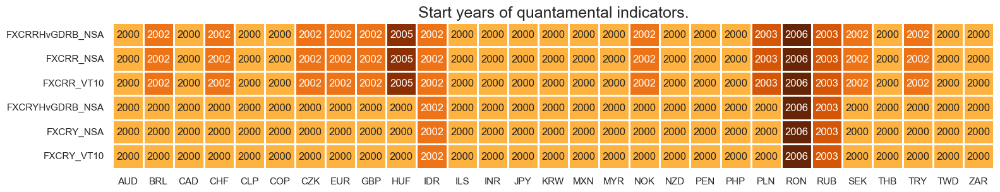

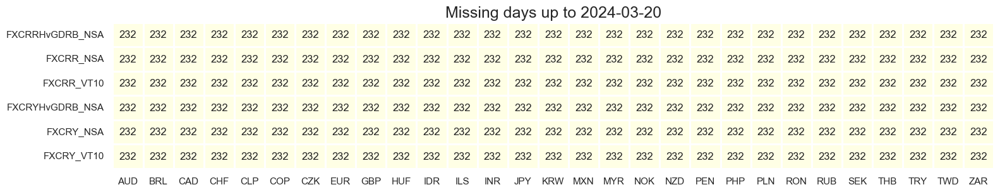

In [7]:
msm.check_availability(df, xcats=main, cids=cids)

# Transformations and checks

## Real carry metrics

Using rolling medians can be a useful approach to mitigate the undue influence of short-term (untradable) carry distortions in financial data. By calculating the median over a rolling window of observations, we obtain a more robust measure of central tendency that is less affected by extreme values or outliers. We use 5-day rolling medians, which aligns with market conventions. This means that for each day, we calculate the median of the previous 5 days' observations. Using rolling medians can help to eliminate short-term (untradeable) carry distortions due to various factors, such as temporary market shocks, liquidity issues, or unusual trading activity. These distortions can have a significant impact on individual data points, leading to misleading results.

In [8]:
calcs = [
    "FXCRY_NSABL5DM = ( FXCRY_NSA ).rolling(5).median()",
    "FXCRR_NSABL5DM = ( FXCRR_NSA ).rolling(5).median()",
    "FXCRR_VT10BL5DM = ( FXCRR_VT10 ).rolling(5).median()",
    "FXCRRHvGDRB_NSABL5DM = ( FXCRRHvGDRB_NSA ).rolling(5).median()",
]
dfa = msp.panel_calculator(df, calcs=calcs, cids=cids_fx, blacklist=fxblack)
dfx = msm.update_df(df, dfa)

As the first step, part of the preliminary analysis, we display FX carry (Nominal forward-implied carry vs. dominant cross) and 5 days rolling median real carry versus dominant cross (with hedges). Please see [here](https://academy.macrosynergy.com/academy/Themes/Stylized%20trading%20factors/_build/html/notebooks/FX%20forward%20carry.php) for the definition of the indicators and [Introduction to Macrosynergy package](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php) for the standard functions used throughout this notebook.

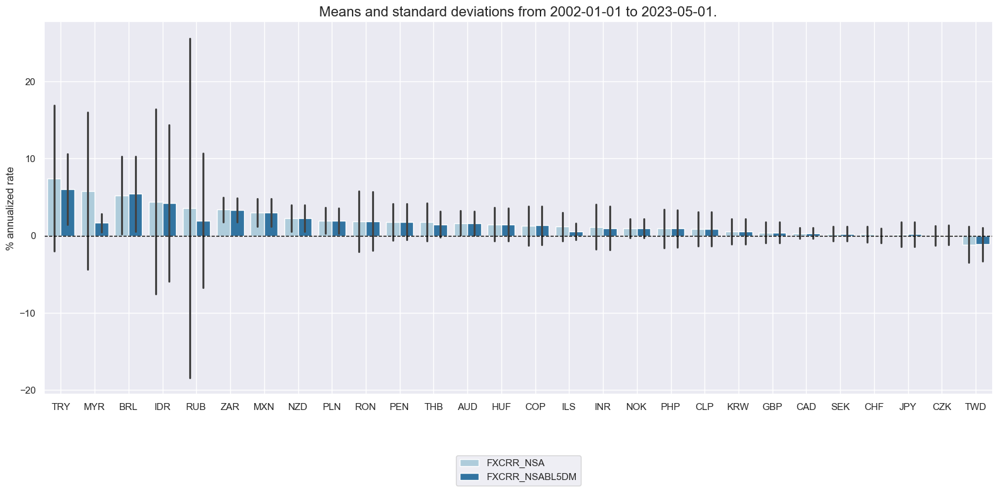

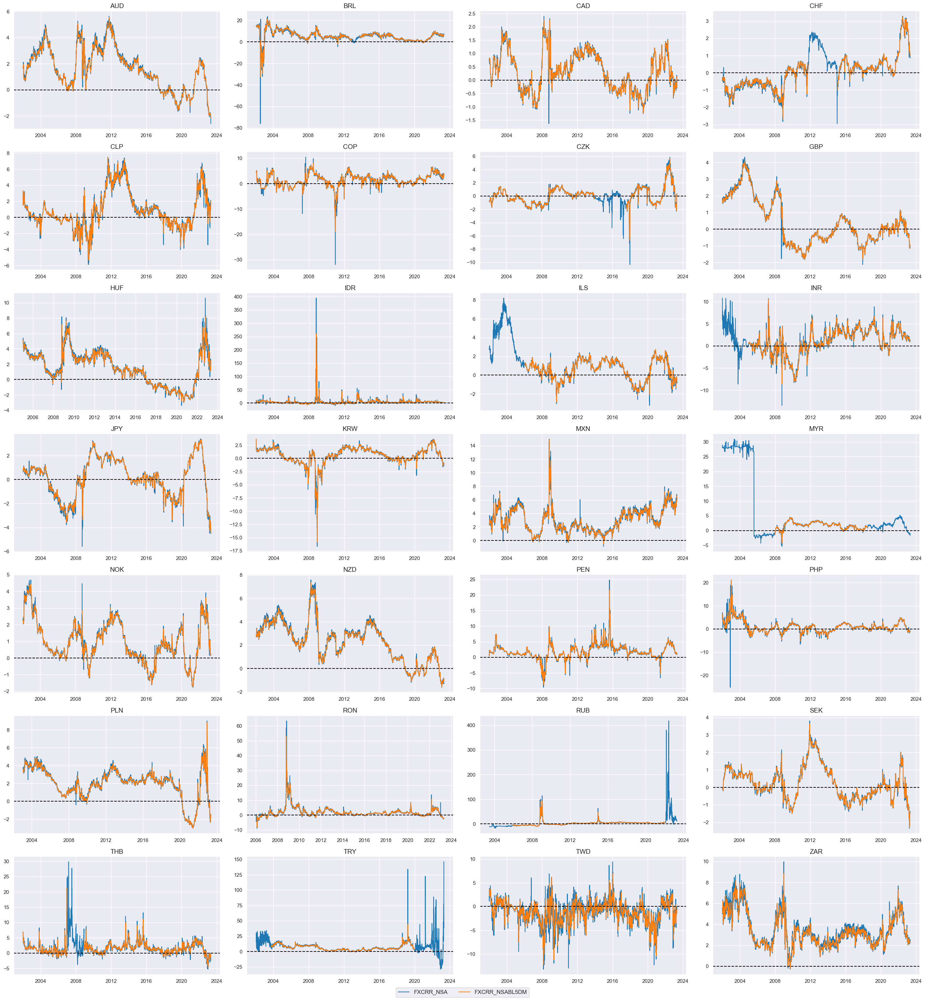

In [9]:
xcats_sel = ["FXCRR_NSA", "FXCRR_NSABL5DM"]
msp.view_ranges(
    dfx,
    cids=cids_fx,
    xcats=xcats_sel,
    kind="bar",
    sort_cids_by="mean",
    title=None,
    ylab="% annualized rate",
    start="2002-01-01",
)
msp.view_timelines(
    dfx,
    xcats=xcats_sel,
    cids=cids_fx,
    ncol=4,
    cumsum=False,
    start="2002-01-01",
    same_y=False,
    size=(12, 12),
    all_xticks=True,
    title=None,
    xcat_labels=None,
)

## Carry adjustments

### Preparations

For convenience, we use the negative of the unemployment rate and replace the name of quarterly employment growth `EMPL_NSA_P1Q1QL4` with `EMPL_NSA_P1M1ML12_3MMA`

In [10]:
calcs = [f"UNEMPLRATE_SA_3MMAv5YMAN = - UNEMPLRATE_SA_3MMAv5YMA"]
dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cids)
dfx = msm.update_df(dfx, dfa)
dfx["xcat"] = dfx["xcat"].str.replace("EMPL_NSA_P1Q1QL4", "EMPL_NSA_P1M1ML12_3MMA")

### Differentials to benchmark

- Relative intuitive GDP growth: This is the difference between quantamental indicators of the estimated GDP growth trend in the reference currency area and the natural benchmark area, i.e. the U.S. or the euro area. Growth trend here means the latest estimable percent change over a year ago in 3-month moving averages (to mitigate monthly volatility). It is based on JPMaQS technical intuitive GDP trends, which are sequential real-time estimates based on regressions that use the latest available national accounts data and monthly-frequency activity data. See the [relevant documentation on the Academy site](https://academy.macrosynergy.com/academy/Themes/Economic%20trends/_build/html/notebooks/Intuitive%20growth%20estimates.php).
- Relative industrial production growth: This is the difference between quantamental indicators of reported industrial output trends in the reference currency area and the natural benchmark country. Production trend is again measured as % over a year ago in 3-month moving averages. Industrial production focuses on tradable goods, for which the exchange rate is particularly important. See also [the related documentation on the Academy site](https://academy.macrosynergy.com/academy/Themes/Economic%20trends/_build/html/notebooks/Industrial%20production%20trends.php)

- Relative employment growth: This is the difference between quantamental indicators of reported employment trends in the reference currency area and the natural benchmark country. Again, the growth trends are measured as % over a year ago in 3-month moving averages. In some countries, employment data are only available at a quarterly frequency and those values are used instead of 3-month averages. See [the related documentation on the Academy site](https://academy.macrosynergy.com/academy/Themes/Economic%20trends/_build/html/notebooks/Labor%20market%20dynamics.php).
- Relative unemployment gaps: This is the difference between quantamental indicators of reported unemployment gaps in the reference currency area and the natural benchmark country. An unemployment gap here means the difference between the latest unemployment rate, seasonally adjusted and as 3-month rolling average or quarterly values, and its 5-year moving average. It is put in negative terms, as low unemployment means economic strength, and, unlike employment growth, is a measure of labor market tightness. See [the relevant documentation](https://academy.macrosynergy.com/academy/Themes/Economic%20trends/_build/html/notebooks/Labor%20market%20tightness.php).

We calculate differentials to benchmarks for three types of currencies: those trading against USD, EUR and both USD and EUR. The list of currencies is as follows:

- Currencies traded against EUR:  ["CHF", "CZK", "HUF", "NOK", "PLN", "RON", "SEK"]  
- Currencies traded against USD and EUR: ["GBP", "RUB", "TRY"]. The benchmark equally weighs USD and EUR data
- Currencies traded against USD: all other currencies in our dataset


In [11]:
pafs = [
    "INTRGDP_NSA_P1M1ML12_3MMA",
    "IP_SA_P1M1ML12_3MMA",
    "EMPL_NSA_P1M1ML12_3MMA",
    "UNEMPLRATE_SA_3MMAv5YMAN",
]


xcatx = pafs

for xc in xcatx:
    calc_eur = [f"{xc}vBM = {xc} - iEUR_{xc}"]
    calc_usd = [f"{xc}vBM = {xc} - iUSD_{xc}"]
    calc_eud = [f"{xc}vBM = {xc} - 0.5 * ( iEUR_{xc} + iUSD_{xc} )"]

    dfa_eur = msp.panel_calculator(
        dfx,
        calcs=calc_eur,
        cids=cids_eur,  # blacklist=fxblack
    )
    dfa_usd = msp.panel_calculator(
        dfx,
        calcs=calc_usd,
        cids=cids_usd,  # blacklist=fxblack
    )
    dfa_eud = msp.panel_calculator(
        dfx,
        calcs=calc_eud,
        cids=cids_eud,  # blacklist=fxblack
    )

    dfa = pd.concat([dfa_eur, dfa_usd, dfa_eud])
    dfx = msm.update_df(dfx, dfa)

The resulting relative growth trends (Relative intuitive GDP growth and Relative industrial production growth as described above) are displayed with the help of customized function `view_timelines()` from the `macrosynergy` package:

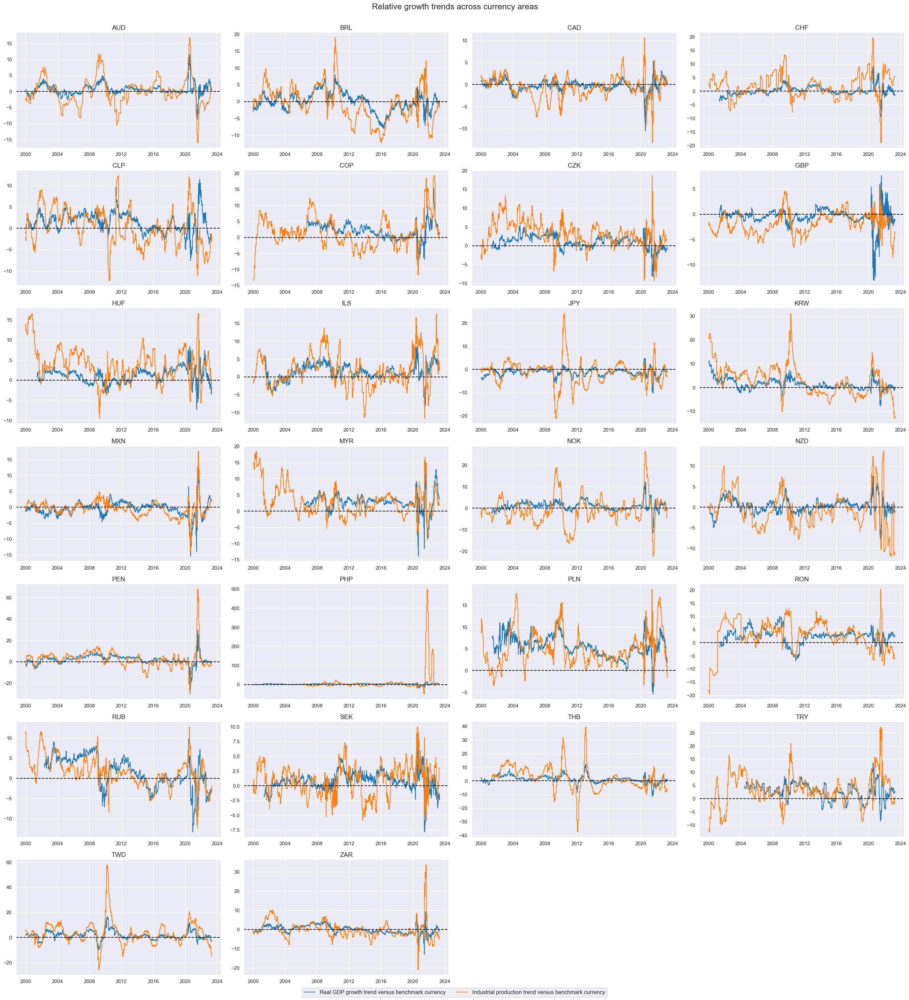

In [12]:
xcatx = ["INTRGDP_NSA_P1M1ML12_3MMAvBM", "IP_SA_P1M1ML12_3MMAvBM"]
msp.view_timelines(
    dfx,
    xcats=xcatx,
    xcat_labels=[
        "Real GDP growth trend versus benchmark currency",
        "Industrial production trend versus benchmark currency",
    ],
    cids=cids_fxx,
    ncol=4,
    cumsum=False,
    start="2000-01-01",
    same_y=False,
    size=(12, 12),
    all_xticks=True,
    title="Relative growth trends across currency areas",
)

Similarly, the relative employment growth and the relative unemployment gaps (vs respective benchmark) are displayed below:

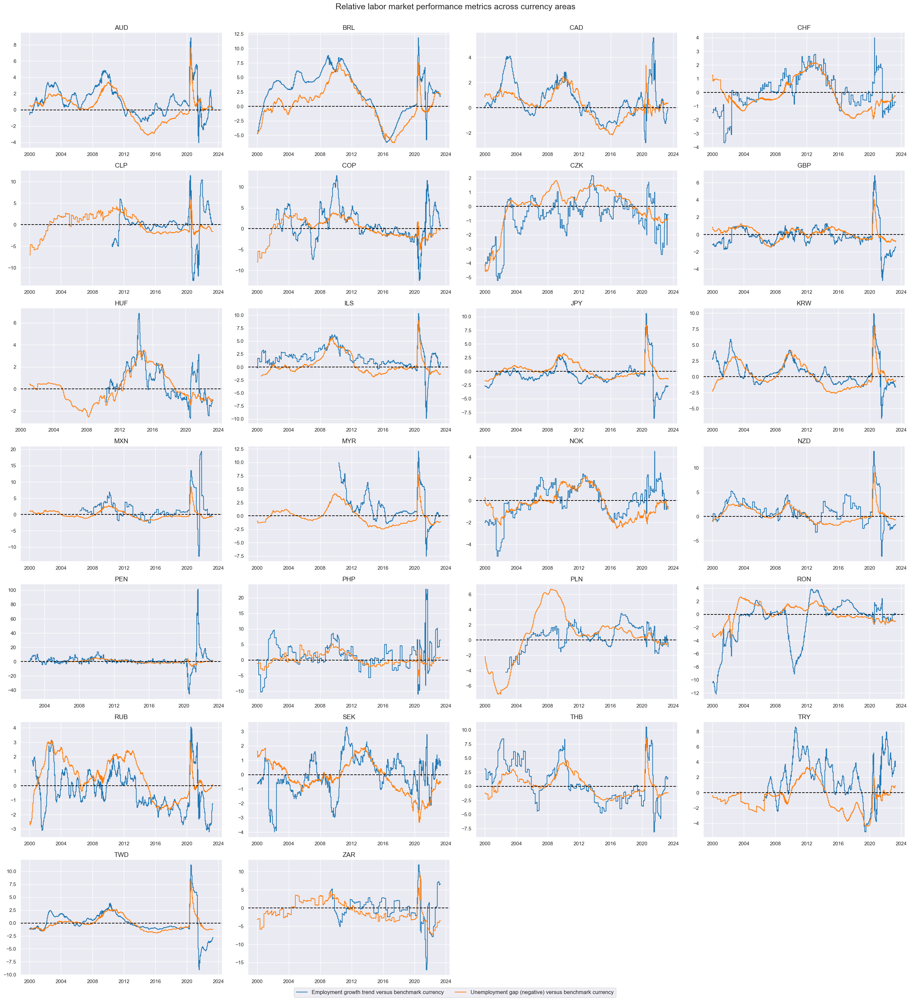

In [13]:
xcatx = ["EMPL_NSA_P1M1ML12_3MMAvBM", "UNEMPLRATE_SA_3MMAv5YMANvBM"]
msp.view_timelines(
    dfx,
    xcats=xcatx,
    xcat_labels=[
        "Employment growth trend versus benchmark currency",
        "Unemployment gap (negative) versus benchmark currency",
    ],
    cids=cids_fxx,
    ncol=4,
    cumsum=False,
    start="2000-01-01",
    same_y=False,
    size=(12, 12),
    all_xticks=True,
    title="Relative labor market performance metrics across currency areas",
)

### Panel zn-scoring

The [`make_zn_scores()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#normalize-panels-with-make-zn-scores) function is a method for normalizing values across different categories. This is particularly important when summing or averaging categories with different units and time series properties. The function computes z-scores for a category panel around a specified neutral level (0 in our case). The term “zn-score” refers to the normalized distance from the neutral value. We first define the categories that we want to calculate zn-score, define min number of observations needed, the neutral value, frequency of re-estimation and threshhold (4 times of standard deviation). The latter allows to exclude particular high volatility periods.  

In [14]:
rafs = [
    "BXBGDPRATIO_NSA_12MMA",  # Basic external balance as % of GDP
    "CABGDPRATIO_NSA_12MMA",  #  External current account as % of GDP
    "MTBGDPRATIO_SA_3MMAv60MMA",  # Merchandise trade balance (sa) as % of GDP: latest 3 months versus 5-year average
    "NIIPGDP_NSA",  # Net international investment position as % of GDP
]
pafs_vbm = [paf + "vBM" for paf in pafs]
crrs = [
    "FXCRR_NSABL5DM",  # 5-day median of FXCRR_NSA (Nominal forward-implied carry vs. dominant cross: % ar)
    "FXCRR_VT10BL5DM",  # 5-day median of FXCRR_VT10 (same as above, but % ar for 10% vol target)
    "FXCRRHvGDRB_NSABL5DM",  # 5-day median of FXCRRHvGDRB_NSA (Nominal carry on 1-month FX forward position, hedged against market directional risk.
]
acats = pafs_vbm + rafs + crrs

In [15]:
for cat in acats:
    dfa = msp.make_zn_scores(
        dfx,
        xcat=cat,
        cids=cids,
        min_obs=3 * 261,
        neutral="zero",
        thresh=4,
        est_freq="m",
    )
    dfx = msm.update_df(dfx, dfa)

### ZN-score differences

For carry modification one can use outright quantamental zn-scores or differences. 
* Modification by outright scores means that the absolute quantamental score modifies the carry. Thus relatively strong economic performance would enhance positive carry, whether or not that carry is already high or not. 
* Modification by relative score means that the difference between the quantamental and carry score modifies the carry. Thus, for positive carry only relatively strong economic performance that is even larger in score than the carry enhances it. Only modest relative economic scores would actually reduce it.

Here the focus is on zn-score differences so far.

In [16]:
dict_afz = {
    "BXB": "BXBGDPRATIO_NSA_12MMAZN",
    "CAB": "CABGDPRATIO_NSA_12MMAZN",
    "MTB": "MTBGDPRATIO_SA_3MMAv60MMAZN",
    "NIP": "NIIPGDP_NSAZN",
    "GDPvBM": "INTRGDP_NSA_P1M1ML12_3MMAvBMZN",
    "INPvBM": "IP_SA_P1M1ML12_3MMAvBM",
    "EMPvBM": "EMPL_NSA_P1M1ML12_3MMAvBM",
    "UMNvBM": "UNEMPLRATE_SA_3MMAv5YMANvBM",
}
dict_crz = {
    "CRR": "FXCRR_NSABL5DMZN",
    "CRV": "FXCRR_VT10BL5DMZN",
    "CRH": "FXCRRHvGDRB_NSABL5DMZN",
}

calcs = []

for cr, crz in dict_crz.items():
    for af, afz in dict_afz.items():
        calcs += [f"{af}v{cr}_ZND = {afz} - {crz}"]

dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cids_fx, blacklist=fxblack)
dfx = msm.update_df(dfx, dfa)

znds = list(dfa["xcat"].unique())

### ZN-score combinations

For zn-score combinations, we first calculate average zn-scores across logical group members and then re-znscore them. Finally, we combine them with carry. We average coefficients groupwise across the available group members so as to not lose history due to a single or just a few short-memory categories.

In [17]:
dict_acs = {
    "GROWTH": ["IP_SA_P1M1ML12_3MMAvBMZN", "INTRGDP_NSA_P1M1ML12_3MMAvBMZN"],
    "LABOR": ["EMPL_NSA_P1M1ML12_3MMAvBMZN", "UNEMPLRATE_SA_3MMAv5YMANvBMZN"],
    "ECO": ["GROWTH", "LABOR"],
    "XBAL": ["CABGDPRATIO_NSA_12MMAZN", "BXBGDPRATIO_NSA_12MMAZN"],
    "XVUL": ["XBAL", "MTBGDPRATIO_SA_3MMAv60MMAZN", "NIIPGDP_NSAZN"],
    "ECXV": ["ECO", "XVUL"],
}

for key, value in dict_acs.items():
    dfxx = dfx[dfx["xcat"].isin(value)]
    dfxx = dfxx.drop(columns=["xcat"])
    dfa = dfxx.groupby(by=["cid", "real_date"]).mean().reset_index()
    dfa["xcat"] = key
    dfx = msm.update_df(dfx, dfa)

In [18]:
for cat in dict_acs.keys():
    dfa = msp.make_zn_scores(
        dfx,
        xcat=cat,
        cids=cids,
        min_obs=3 * 261,
        neutral="zero",
        thresh=4,
        est_freq="m",
    )
    dfx = msm.update_df(dfx, dfa)

In [19]:
calcs = []
for cr, crz in dict_crz.items():
    for ac in dict_acs.keys():
        calcs += [f"{cr}_{ac}_ZNC = {crz} + {ac}ZN"]
dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cids)
dfx = msm.update_df(dfx, dfa)

zncs = list(dfa["xcat"].unique())

Here we compare the vol-targeted real FX carry signal (zn-scored) and the same signal balanced by relative growth and labor market performance.

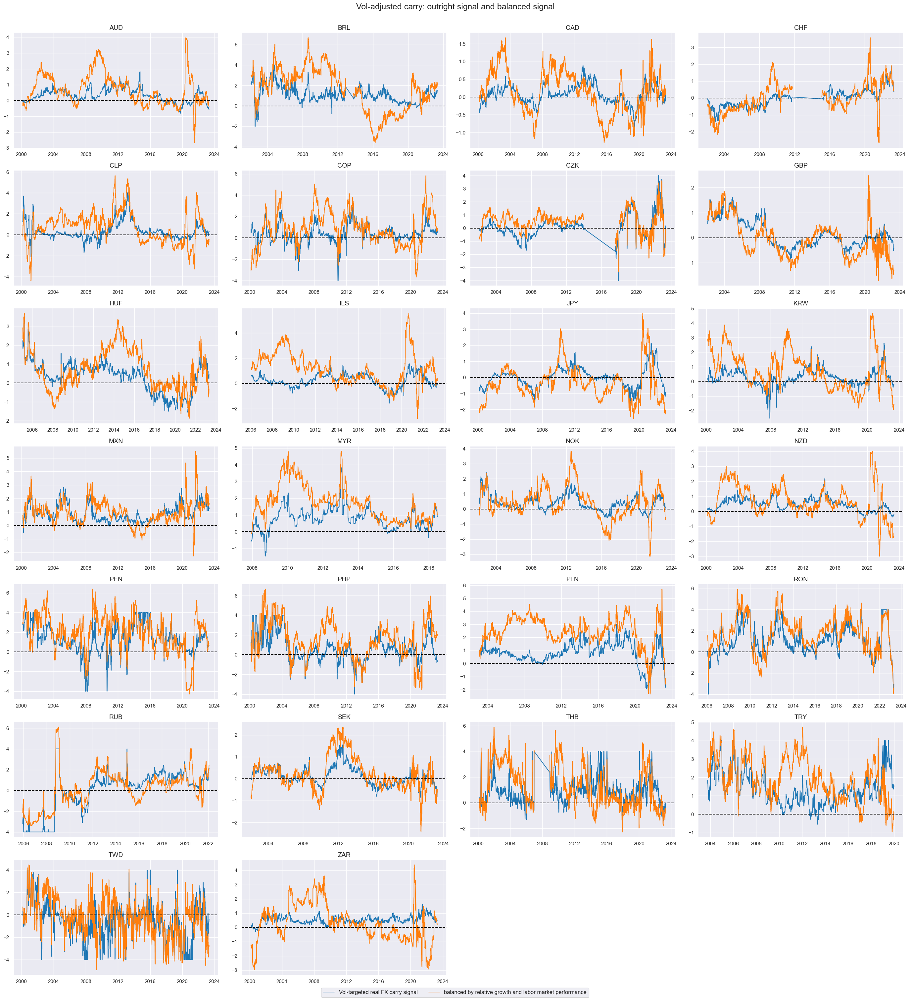

In [20]:
xcatx = ["FXCRR_VT10BL5DMZN", "CRV_ECO_ZNC"]
msp.view_timelines(
    dfx,
    xcats=xcatx,
    xcat_labels=[
        "Vol-targeted real FX carry signal",
        "balanced by relative growth and labor market performance",
    ],
    cids=cids_fxx,
    ncol=4,
    cumsum=False,
    start="2000-01-01",
    same_y=False,
    size=(12, 12),
    all_xticks=True,
    title="Vol-adjusted carry: outright signal and balanced signal",
)

Similar analysis for hedged against market directional risk carry displays the relative performance of the balanced signal versus the outright signal for hedged carry. Balancing affects both the magnitude and direction of the carry signal.

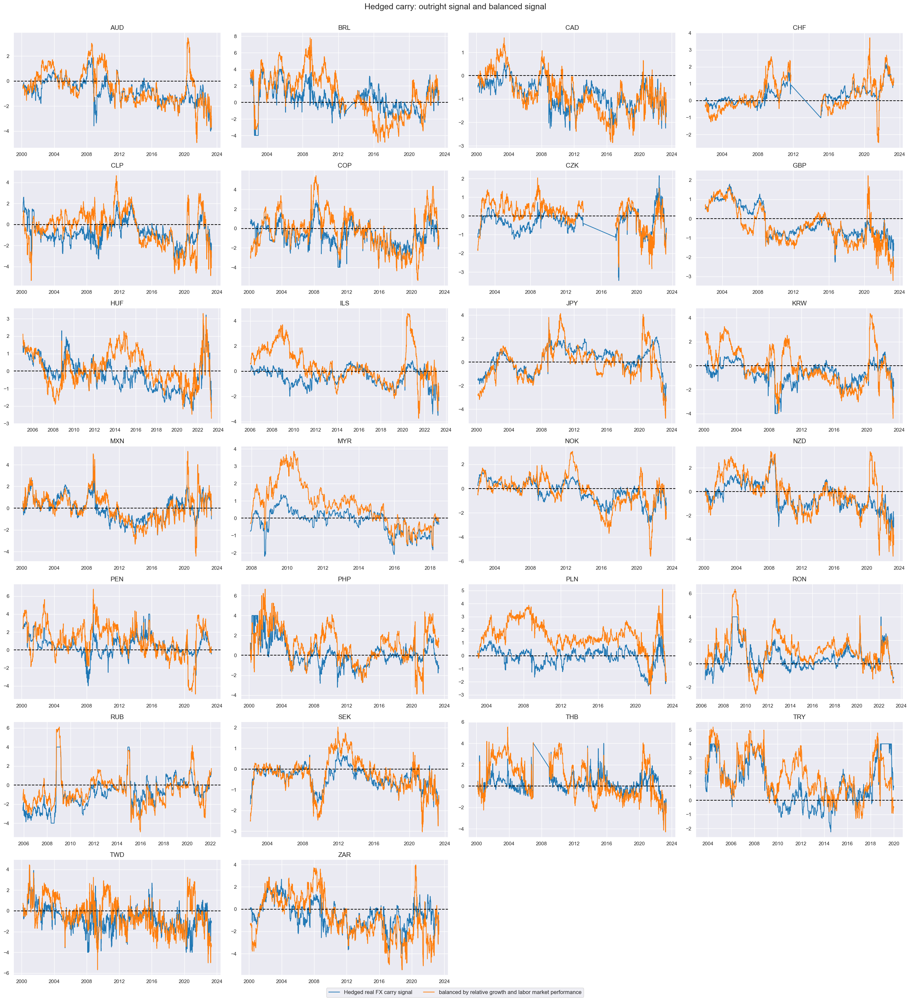

In [21]:
xcatx = ["FXCRRHvGDRB_NSABL5DMZN", "CRH_ECO_ZNC"]
msp.view_timelines(
    dfx,
    xcats=xcatx,
    xcat_labels=[
        "Hedged real FX carry signal",
        "balanced by relative growth and labor market performance",
    ],
    cids=cids_fxx,
    ncol=4,
    cumsum=False,
    start="2000-01-01",
    same_y=False,
    size=(12, 12),
    all_xticks=True,
    title="Hedged carry: outright signal and balanced signal",
)

### Sigmoid modification

#### Sigmoid function

The basis for modifying real-carry signals is a logistic ("sigmoid") transformation of differences of the z-scores of performance and risk factors. This transformation results in values between 0 and 2 for the adjustment factor.  The goal is to modify the real-carry signal by considering the difference between economic performance and carry, where a positive real carry should be enhanced by strong economic performance and diminished by weak relative performance, and vice versa for negative carry. The economic performance should not dominate the signal, but only modify its magnitude. 

Here is a breakdown of the formula for adjusted carry:

1. Calculate the coefficient (coef) for adjustment:

coef = 2 / (1 + exp(  - sign(crr) * znr ))

crr represents the real carry signal, and znr is the z-score of the economic factors.


2. Define the adjusted carry (cra) based on the sign of the real carry:

For positive carry:
cra = coef * crr
For negative carry:
cra = (2 - coef) * crr


3. Or in one equation:

cra = ((1 - sign(crr)) + sign(crr) * coef )* crr

The formula ensures that the adjustment coefficient is between 0 and 2, depending on the sign of the real carry. A strong positive economic performance enhances the positive carry signal, while a weak relative performance diminishes it. Similarly, for negative carry, a weak economic performance enhances the negative signal, and a strong performance diminishes it.

The sigmoid function has been specified such that a 2 SD difference between the carry score and the performance or risk score reduces the carry signal by 75%. Similarly, a 2 SD difference between the performance or risk scores and the carry scores increases the carry signal by 75%.

This type of adjustment only manages the carry signal. It never supersedes it.
By incorporating the adjustment factor based on economic performance, you modify the magnitude of the real-carry signal while still considering its sign. This allows you to balance the impact of economic performance on the carry metric without overwhelming its influence, resulting in an adjusted carry that reflects both the carry itself and the relative economic performance.

It's worth noting that the formula can be customized further based on specific requirements, such as adjusting the coefficient range or introducing additional parameters. Adjustments and fine-tuning can be made based on analysis objectives and the characteristics of the data and factors.

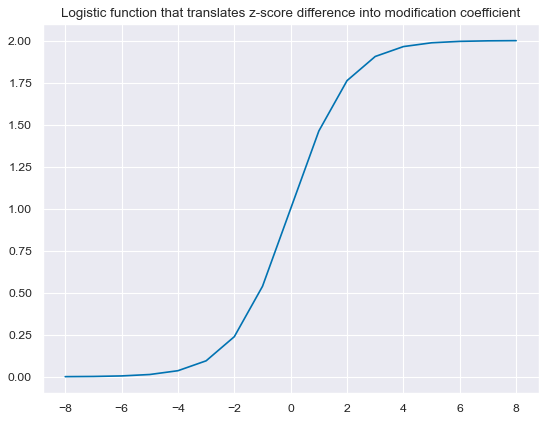

In [22]:
def sigmoid(x):
    return 2 / (1 + np.exp(-1 * x))


ar = np.array([i for i in range(-8, 9)])
plt.figure(figsize=(8, 6), dpi=80)
plt.plot(ar, sigmoid(ar))
plt.title(
    "Logistic function that translates z-score difference into modification coefficient"
)
plt.show()

#### Sigmoid coefficients

Calculate sigmoid functions of zn-score differences between adjustment factor and carry.

In [23]:
calcs = []
for znd in znds:
    calcs += [f"{znd}_C = ( {znd} ).applymap( lambda x: 2 / (1 + np.exp( - x)) ) "]
dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cids_fx, blacklist=fxblack)
dfx = msm.update_df(dfx, dfa)

afs = list(dfa["xcat"].unique())

Averaging coefficients groupwise across available group members is a useful approach to avoid losing historical information due to missing signals or a few categories with short memory. This approach allows to incorporate the contributions of multiple group members, ensuring a more comprehensive representation of the data.

In [24]:
dict_acz = {}
for cr in dict_crz.keys():
    dict_add = {
        f"GROWTHv{cr}_C": [f"GDPvBMv{cr}_ZND_C", f"INPvBMv{cr}_ZND_C"],
        f"LABORv{cr}_C": [f"EMPvBMv{cr}_ZND_C", f"UMNvBMv{cr}_ZND_C"],
        f"ECOv{cr}_C": [f"GROWTHv{cr}_C", f"LABORv{cr}_C"],
        f"XBALv{cr}_C": [f"CABv{cr}_ZND_C", f"BXBv{cr}_ZND_C"],
        f"XVULv{cr}_C": [f"XBALv{cr}_C", f"MTBv{cr}_ZND_C", f"NIPv{cr}_ZND_C"],
        f"ECXVv{cr}_C": [f"ECOv{cr}_C", f"XVULv{cr}_C"],
    }
    dict_acz.update(dict_add)

for key, value in dict_acz.items():
    dfxx = dfx[dfx["xcat"].isin(value)]
    dfxx = dfxx.drop(columns=["xcat"])
    dfa = dfxx.groupby(by=["cid", "real_date"]).mean().reset_index()
    dfa["xcat"] = key
    dfx = msm.update_df(dfx, dfa)

For easier viewing of results, we combine the modification coefficients for growth and labor market performance and for overall economic performance. Combining here means averaging the coefficients, except for periods where only one coefficient could be calculated. Below chart displays coefficients based on growth differentials and on labor market differentials.

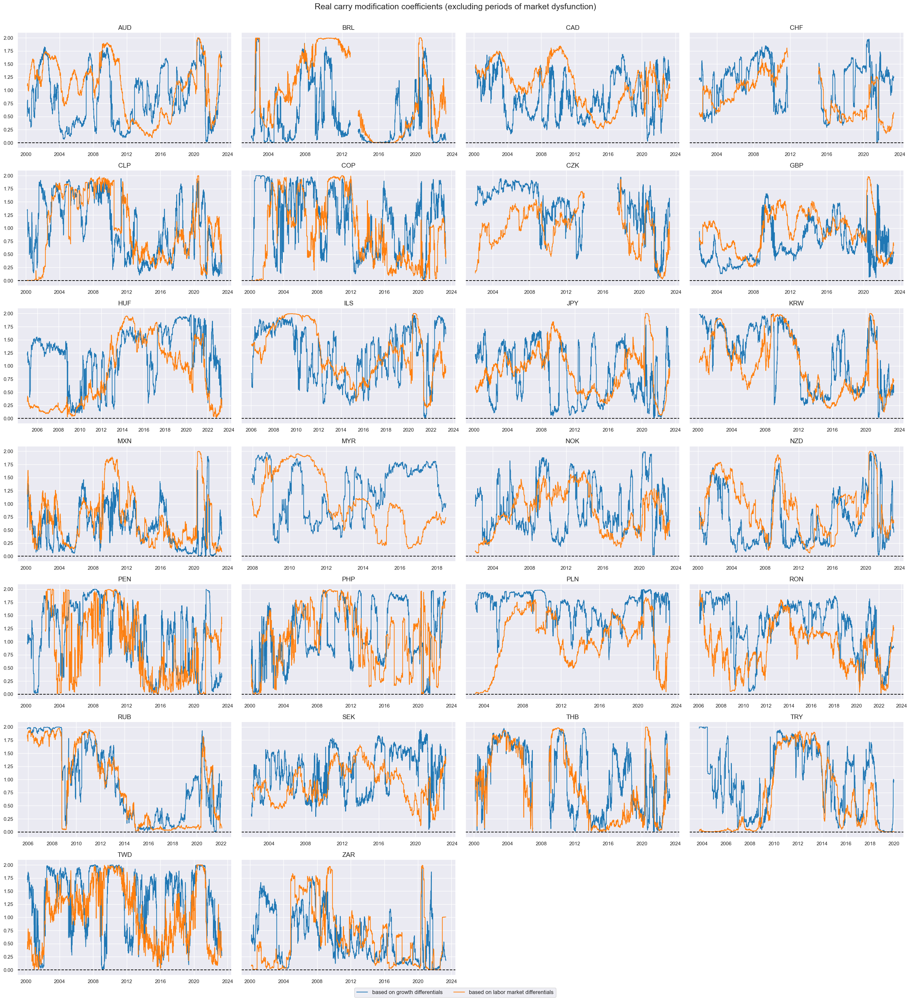

In [25]:
xcatx = ["GROWTHvCRR_C", "LABORvCRR_C"]
msp.view_timelines(
    dfx,
    xcats=xcatx,
    xcat_labels=[
        "based on growth differentials",
        "based on labor market differentials",
    ],
    cids=cids_fxx,
    ncol=4,
    cumsum=False,
    start="2000-01-01",
    same_y=True,
    size=(12, 12),
    all_xticks=True,
    title="Real carry modification coefficients (excluding periods of market dysfunction)",
)

### Carry adjustment

The cell below adjusts the carry signals by the modification coefficients.

In [26]:
calcs = []
for cr, crz in dict_crz.items():
    calcs += [f"{cr}_SIGN = np.sign( {crz} )"]
    for af in dict_acs.keys():
        sign = f"{cr}_SIGN"
        coef = f"{af}v{cr}_C"
        calcs += [f"{cr}m{af} = ( ( 1 - {sign} ) + {sign} * {coef} ) * {crz}"]
dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cids_fx, blacklist=fxblack)
dfx = msm.update_df(dfx, dfa)

Performance-adjusted carry is a more stable, less volatile, series than standard carry as large deviation between carry and fundamentals are de-emphasized. In particular, extreme carry values lead to adjusted values close to zero and are thus taken out as signals.

In [27]:
modcrs = [cr + "m" + af for cr in dict_crz.keys() for af in dict_acs.keys()]
[cr + "m" + af for cr in dict_crz.keys() for af in dict_acs.keys()]

['CRRmGROWTH',
 'CRRmLABOR',
 'CRRmECO',
 'CRRmXBAL',
 'CRRmXVUL',
 'CRRmECXV',
 'CRVmGROWTH',
 'CRVmLABOR',
 'CRVmECO',
 'CRVmXBAL',
 'CRVmXVUL',
 'CRVmECXV',
 'CRHmGROWTH',
 'CRHmLABOR',
 'CRHmECO',
 'CRHmXBAL',
 'CRHmXVUL',
 'CRHmECXV']

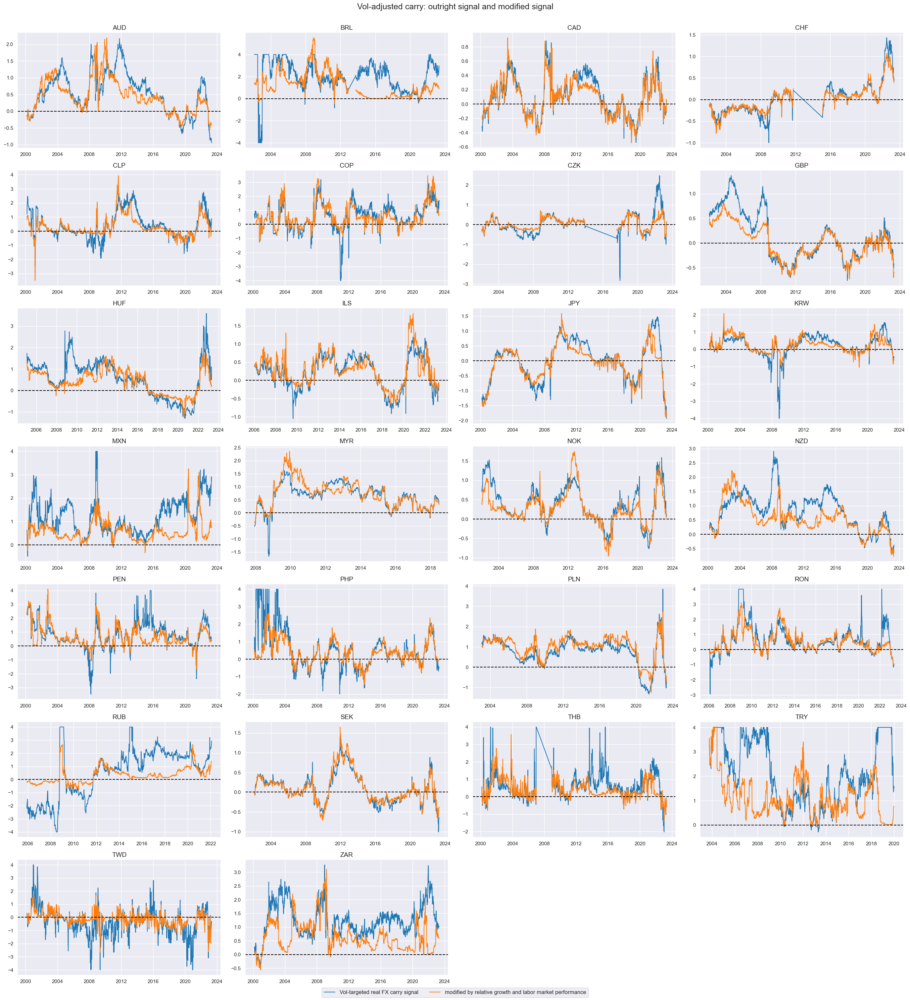

In [28]:
xcatx = ["FXCRR_NSABL5DMZN", "CRRmECO"]
msp.view_timelines(
    dfx,
    xcats=xcatx,
    xcat_labels=[
        "Vol-targeted real FX carry signal",
        "modified by relative growth and labor market performance",
    ],
    cids=cids_fxx,
    ncol=4,
    cumsum=False,
    start="2000-01-01",
    same_y=False,
    size=(12, 12),
    all_xticks=True,
    title="Vol-adjusted carry: outright signal and modified signal",
)

The same visualization is done for hedged real carry strategy, which takes both FX forward and hedge basket positions for trades across all tradable FX forwards markets at a monthly frequency. As for vol-targeted carry, modification changes mainly relative signal strength, but also seems to enhance signal stability, which suggests that it will probably save some transaction costs (transaction costs are not explicitly considered in this analysis). Hedged carry alone has been more prone to outliers due to instability in estimated hedge ratios.

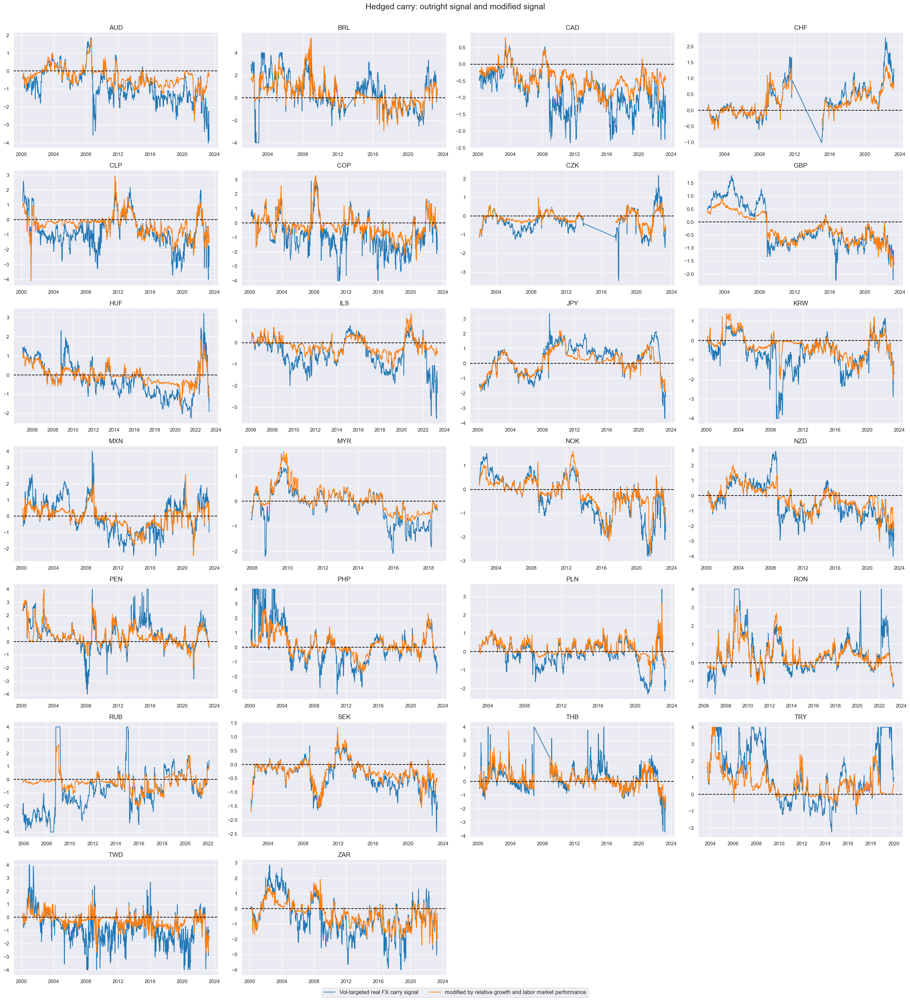

In [29]:
xcatx = ["FXCRRHvGDRB_NSABL5DMZN", "CRHmECO"]
msp.view_timelines(
    dfx,
    xcats=xcatx,
    xcat_labels=[
        "Vol-targeted real FX carry signal",
        "modified by relative growth and labor market performance",
    ],
    cids=cids_fxx,
    ncol=4,
    cumsum=False,
    start="2000-01-01",
    same_y=False,
    size=(12, 12),
    all_xticks=True,
   title="Hedged carry: outright signal and modified signal",
)

# Value checks

## Modified carry

### Modified vol-targeted carry

Here we check and compare simple trading strategies based on the value generated by the modified carry signal and the hedged carry signal. In preparation for simple PnL calculation, we define the target variable (`FXXR_VT10`) and the main signal (`CRVmECXV` - vol-targeted real FX carry signal modified by relative growth and labor market performance). As alternative signals we consider FX carries modified with different economic indicators calculated earlier in the notebook.

In [30]:
dict_mcrv = {
    "sig": "CRVmECXV",
    "rivs": [
        "CRVmGROWTH",
        "CRVmLABOR",
        "CRVmECO",
        "CRVmXBAL",
        "CRVmXVUL",
        "FXCRR_VT10BL5DMZN",
    ],
    "targ": "FXXR_VT10",
    "cidx": cids_fxx,
    "srr": None,
    "pnls": None,
}

In [31]:
dix = dict_mcrv

sig = dix["sig"]
rivs = dix["rivs"]
targ = dix["targ"]
cidx = dix["cidx"]

srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=[sig] + rivs,
    rets=targ,
    freqs="M",
    start="2000-01-01",
    blacklist=fxblack,
)

dict_mcrv["srr"] = srr

In [32]:
dix = dict_mcrv
srrx = dix["srr"]
display(srrx.summary_table().astype("float").round(3))

,accuracy,bal_accuracy,pos_sigr,pos_retr,pos_prec,neg_prec,pearson,pearson_pval,kendall,kendall_pval,auc
Panel,0.548,0.536,0.735,0.542,0.561,0.511,0.056,0.000,0.051,0.000,0.528
Mean years,0.550,0.538,0.728,0.538,0.561,0.515,0.061,0.361,0.053,0.324,0.531
Positive ratio,0.792,0.833,0.958,0.667,0.708,0.542,0.750,0.542,0.833,0.625,0.833
Mean cids,0.548,0.535,0.739,0.545,0.556,0.514,0.036,0.440,0.037,0.411,0.517
Positive ratio,0.808,0.769,0.923,0.846,0.808,0.538,0.654,0.346,0.769,0.500,0.769


In [33]:
dix = dict_mcrv
srrx = dix["srr"]
display(srrx.signals_table().astype("float").round(3))

,accuracy,bal_accuracy,pos_sigr,pos_retr,pos_prec,neg_prec,pearson,pearson_pval,kendall,kendall_pval,auc
CRVmECXV,0.548,0.536,0.735,0.542,0.561,0.511,0.056,0.000,0.051,0.000,0.528
CRVmGROWTH,0.548,0.536,0.735,0.542,0.561,0.511,0.063,0.000,0.053,0.000,0.528
CRVmLABOR,0.547,0.536,0.734,0.541,0.560,0.511,0.071,0.000,0.057,0.000,0.528
CRVmECO,0.548,0.536,0.735,0.542,0.561,0.511,0.075,0.000,0.061,0.000,0.528
CRVmXBAL,0.548,0.536,0.735,0.542,0.562,0.511,0.013,0.308,0.027,0.001,0.528
CRVmXVUL,0.548,0.536,0.735,0.542,0.561,0.511,0.010,0.406,0.025,0.003,0.528
FXCRR_VT10BL5DMZN,0.548,0.536,0.735,0.542,0.561,0.511,0.040,0.001,0.044,0.000,0.528


In [34]:
dix = dict_mcrv

sigx = [dix["sig"]] + dix["rivs"]
targ = dix["targ"]
cidx = dix["cidx"]

naive_pnl = msn.NaivePnL(
    dfx,
    ret=targ,
    sigs=sigx,
    cids=cidx,
    start="2000-01-01",
    blacklist=fxblack,
    # bms="EUR_FXXR_NSA",
)

for sig in sigx:
    naive_pnl.make_pnl(
        sig,
        sig_neg=False,
        sig_op="zn_score_pan",
        thresh=4,
        rebal_freq="monthly",
        vol_scale=10,
        rebal_slip=1,
        pnl_name=sig + "_PZN",
    )

dict_mcrv["pnls"] = naive_pnl

The plot below compares the performance of the naive carry strategy to the performance of the modified carry strategy. The modified strategy is the naive strategy with the carry signal modified by relative growth and labor market performance. The modified strategy is more profitable than the simple vol-targeted carry strategy on its own and modified with economic indicators (growth, labor market and both growth and labor at the same time)

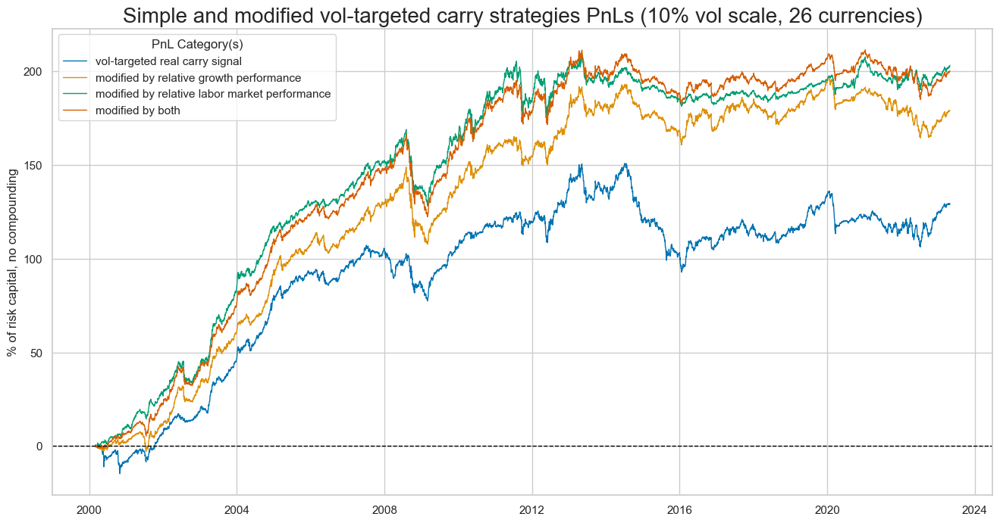

In [35]:
dix = dict_mcrv

sigx = [
    "FXCRR_VT10BL5DMZN",
    "CRVmGROWTH",
    "CRVmLABOR",
    "CRVmECO",
]
naive_pnl = dix["pnls"]
pnls = [sig + "_PZN" for sig in sigx]

dict_labels={"FXCRR_VT10BL5DMZN_PZN":"vol-targeted real carry signal",
"CRVmGROWTH_PZN": "modified by relative growth performance",
"CRVmLABOR_PZN": "modified by relative labor market performance",
"CRVmECO_PZN": "modified by both"
}


naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start="2000-01-01",
    title="Simple and modified vol-targeted carry strategies PnLs (10% vol scale, 26 currencies)",
    xcat_labels=dict_labels,
    figsize=(16, 8),
)

Simulated PnLs of modified vol-adjusted carry strategies are substantially better not only on absolute basis, but also in terms of Sharpe and Sortino ratios: Both ratios increase substantially from 0.2 and 0.3 respectively without modification to 0.6 and 0.91 using the average of growth and labour market modification. This means volatility-adjusted returns have more than doubled thanks to modification. For labour market modification alone the Sharpe ratio would have been just below 0.7.

In [36]:
dix = dict_mcrv

sigx = [
    "CRVmGROWTH",
    "CRVmLABOR",
    "CRVmECO",
    "FXCRR_VT10BL5DMZN",
]  # [dix["sig"]] + dix["rivs"]
naive_pnl = dix["pnls"]
pnls = [sig + "_PZN" for sig in sigx]

df_eval = naive_pnl.evaluate_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start="2000-01-01",
)
display(df_eval)

xcat,CRVmECO_PZN,CRVmGROWTH_PZN,CRVmLABOR_PZN,FXCRR_VT10BL5DMZN_PZN
Return (pct ar),8.646821,7.731052,8.777746,5.588816
St. Dev. (pct ar),10.0,10.0,10.0,10.0
Sharpe Ratio,0.864682,0.773105,0.877775,0.558882
Sortino Ratio,1.20344,1.075685,1.224797,0.77533
Max 21-day draw,-19.804979,-20.332016,-23.344979,-19.908141
Max 6-month draw,-36.018961,-35.031022,-32.786924,-31.041654
Traded Months,280,280,280,280


### Modified real hedged carry

Here we perform similar analysis for the hedged carry strategy. The target variable is Hedged FX forward return, the main signal is hedged carry modified by relative growth, labor market, external ratios, external balance ratios, and international investment position. The rival signals are the same as for the vol-adjusted carry strategy, but calculated on hedged positions.

In [37]:
dict_mcrh = {
    "sig": "CRHmECXV",
    "rivs": [
        "CRHmGROWTH",
        "CRHmLABOR",
        "CRHmECO",
        "CRHmXBAL",
        "CRHmXVUL",
        "FXCRRHvGDRB_NSABL5DMZN",
    ],
    "targ": "FXXRHvGDRB_NSA",
    "cidx": cids_fxx,
    "srr": None,
    "pnls": None,
}

In [38]:
dix = dict_mcrh

sig = dix["sig"]
rivs = dix["rivs"]
targ = dix["targ"]
cidx = dix["cidx"]

srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=[sig] + rivs,
    rets=targ,
    freqs="M",
    start="2000-01-01",
    blacklist=fxblack,
)

dict_mcrh["srr"] = srr

In [39]:
dix = dict_mcrh
srrx = dix["srr"]
display(srrx.summary_table().astype("float").round(3))

,accuracy,bal_accuracy,pos_sigr,pos_retr,pos_prec,neg_prec,pearson,pearson_pval,kendall,kendall_pval,auc
Panel,0.543,0.546,0.396,0.502,0.557,0.534,0.083,0.000,0.071,0.000,0.544
Mean years,0.547,0.546,0.403,0.501,0.556,0.536,0.079,0.285,0.063,0.235,0.541
Positive ratio,0.917,0.875,0.250,0.583,0.792,0.708,0.917,0.750,0.917,0.833,0.875
Mean cids,0.543,0.546,0.404,0.503,0.554,0.538,0.074,0.263,0.069,0.230,0.537
Positive ratio,0.962,0.923,0.269,0.423,0.846,0.808,0.885,0.769,0.962,0.769,0.923


In [40]:
dix = dict_mcrh
srrx = dix["srr"]
display(srrx.signals_table().astype("float").round(3))

,accuracy,bal_accuracy,pos_sigr,pos_retr,pos_prec,neg_prec,pearson,pearson_pval,kendall,kendall_pval,auc
CRHmECXV,0.543,0.546,0.396,0.502,0.557,0.534,0.083,0.0,0.071,0.0,0.544
CRHmGROWTH,0.543,0.546,0.396,0.502,0.557,0.534,0.073,0.0,0.071,0.0,0.544
CRHmLABOR,0.542,0.544,0.393,0.500,0.554,0.534,0.084,0.0,0.075,0.0,0.542
CRHmECO,0.543,0.546,0.396,0.502,0.557,0.534,0.086,0.0,0.077,0.0,0.544
CRHmXBAL,0.544,0.546,0.395,0.502,0.558,0.534,0.059,0.0,0.057,0.0,0.544
CRHmXVUL,0.543,0.546,0.396,0.502,0.557,0.534,0.064,0.0,0.057,0.0,0.544
FXCRRHvGDRB_NSABL5DMZN,0.543,0.546,0.396,0.502,0.557,0.534,0.076,0.0,0.066,0.0,0.544


In [41]:
dix = dict_mcrh

sigx = [dix["sig"]] + dix["rivs"]
targ = dix["targ"]
cidx = dix["cidx"]

naive_pnl = msn.NaivePnL(
    dfx,
    ret=targ,
    sigs=sigx,
    cids=cidx,
    start="2000-01-01",
    blacklist=fxblack,
    #  bms="EUR_FXXR_NSA",
)

for sig in sigx:
    naive_pnl.make_pnl(
        sig,
        sig_neg=False,
        sig_op="zn_score_pan",
        thresh=4,
        rebal_freq="monthly",
        vol_scale=10,
        rebal_slip=1,
        pnl_name=sig + "_PZN",
    )

dict_mcrh["pnls"] = naive_pnl

In [42]:
dix = dict_mcrh

sigx = [
    "CRHmGROWTH",
    "CRHmLABOR",
    "CRHmECO",
    "FXCRRHvGDRB_NSABL5DMZN",
]  # [dix["sig"]] + dix["rivs"]
naive_pnl = dix["pnls"]
pnls = [sig + "_PZN" for sig in sigx]

df_eval = naive_pnl.evaluate_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start="2000-01-01",
)
display(df_eval)

xcat,CRHmECO_PZN,CRHmGROWTH_PZN,CRHmLABOR_PZN,FXCRRHvGDRB_NSABL5DMZN_PZN
Return (pct ar),9.274164,9.111688,9.217159,8.507911
St. Dev. (pct ar),10.0,10.0,10.0,10.0
Sharpe Ratio,0.927416,0.911169,0.921716,0.850791
Sortino Ratio,1.324127,1.306364,1.32104,1.230493
Max 21-day draw,-20.440585,-19.902178,-20.76419,-14.509827
Max 6-month draw,-33.235589,-30.832945,-29.141803,-17.653845
Traded Months,280,280,280,280


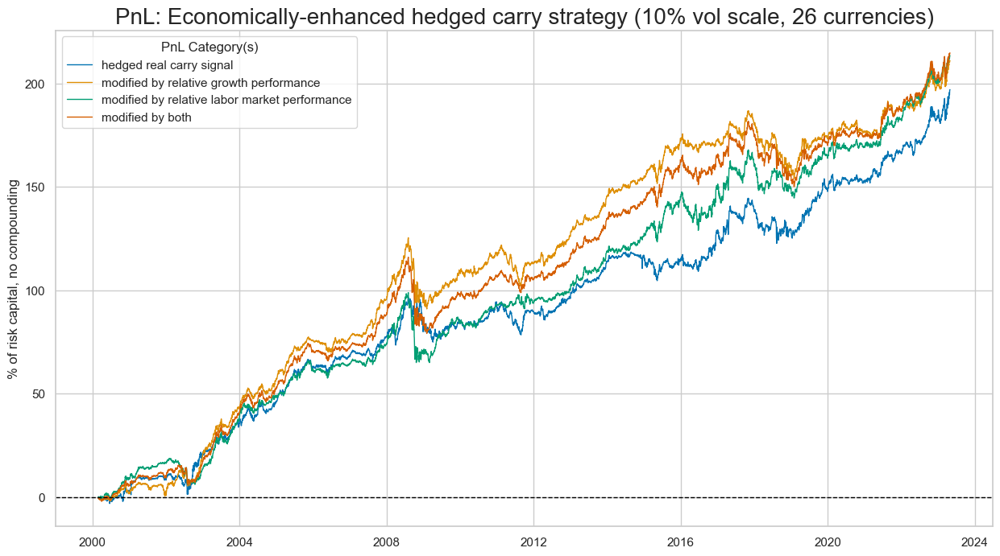

In [45]:
dix = dict_mcrh

sigx = [
    "FXCRRHvGDRB_NSABL5DMZN",
    "CRHmGROWTH",
    "CRHmLABOR",
    "CRHmECO",
]  # [dix["sig"]] + dix["rivs"]
naive_pnl = dix["pnls"]
pnls = [sig + "_PZN" for sig in sigx]

dict_labels={"FXCRRHvGDRB_NSABL5DMZN_PZN":"hedged real carry signal",
"CRHmGROWTH_PZN": "modified by relative growth performance",
"CRHmLABOR_PZN": "modified by relative labor market performance",
"CRHmECO_PZN": "modified by both"
}


naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start="2000-01-01",
    title="PnL: Economically-enhanced hedged carry strategy (10% vol scale, 26 currencies)",
    xcat_labels=dict_labels,
    figsize=(15, 8),
)

## Balanced carry

### Balanced vol-adjusted carry

In [46]:
dict_bcrv = {
    "sig": "CRV_ECXV_ZNC",
    "rivs": [
        "CRV_GROWTH_ZNC",
        "CRV_LABOR_ZNC",
        "CRV_ECO_ZNC",
        "CRV_XBAL_ZNC",
        "CRV_XVUL_ZNC",
        "FXCRR_VT10BL5DMZN",
    ],
    "targ": "FXXR_VT10",
    "cidx": cids_fxx,
    "srr": None,
    "pnls": None,
}

In [47]:
dix = dict_bcrv

sig = dix["sig"]
rivs = dix["rivs"]
targ = dix["targ"]
cidx = dix["cidx"]

srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=[sig] + rivs,
    rets=targ,
    freqs="M",
    start="2000-01-01",
    blacklist=fxblack,
)

dict_bcrv["srr"] = srr

In [48]:
dix = dict_bcrv
srrx = dix["srr"]
display(srrx.summary_table().astype("float").round(3))

,accuracy,bal_accuracy,pos_sigr,pos_retr,pos_prec,neg_prec,pearson,pearson_pval,kendall,kendall_pval,auc
Panel,0.540,0.528,0.694,0.542,0.560,0.497,0.067,0.000,0.053,0.000,0.524
Mean years,0.541,0.521,0.689,0.538,0.550,0.493,0.052,0.385,0.042,0.374,0.516
Positive ratio,0.708,0.667,0.917,0.667,0.667,0.417,0.750,0.542,0.833,0.625,0.667
Mean cids,0.540,0.531,0.706,0.545,0.562,0.478,0.068,0.288,0.057,0.243,0.521
Positive ratio,0.885,0.692,0.808,0.846,0.846,0.462,0.808,0.692,0.846,0.731,0.654


In [49]:
dix = dict_bcrv

sigx = [dix["sig"]] + dix["rivs"]
targ = dix["targ"]
cidx = dix["cidx"]

naive_pnl = msn.NaivePnL(
    dfx,
    ret=targ,
    sigs=sigx,
    cids=cidx,
    start="2000-01-01",
    blacklist=fxblack,
    #   bms="EUR_FXXR_NSA",
)

for sig in sigx:
    naive_pnl.make_pnl(
        sig,
        sig_neg=False,
        sig_op="zn_score_pan",
        thresh=4,
        rebal_freq="monthly",
        vol_scale=10,
        rebal_slip=1,
        pnl_name=sig + "_PZN",
    )

dict_bcrv["pnls"] = naive_pnl

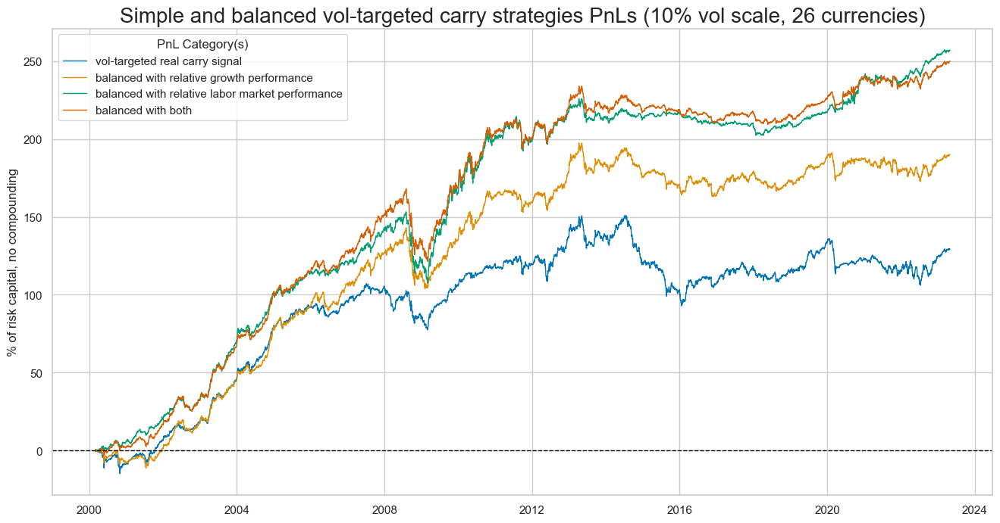

In [51]:
dix = dict_bcrv

sigx = [
    "FXCRR_VT10BL5DMZN",
    "CRV_GROWTH_ZNC",
    "CRV_LABOR_ZNC",
    "CRV_ECO_ZNC",
]
pnls = [sig + "_PZN" for sig in sigx]

dict_labels={"FXCRR_VT10BL5DMZN_PZN":"vol-targeted real carry signal",
"CRV_GROWTH_ZNC_PZN": "balanced with relative growth performance",
"CRV_LABOR_ZNC_PZN": "balanced with relative labor market performance",
"CRV_ECO_ZNC_PZN": "balanced with both"
}

naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start="2000-01-01",
    title="Simple and balanced vol-targeted carry strategies PnLs (10% vol scale, 26 currencies)",
    xcat_labels=dict_labels,
    figsize=(16, 8),
)

In [52]:
dix = dict_bcrv

sigx = [
    "FXCRR_VT10BL5DMZN",
    "CRV_GROWTH_ZNC",
    "CRV_LABOR_ZNC",
    "CRV_ECO_ZNC",
]  # [dix["sig"]] + dix["rivs"]
naive_pnl = dix["pnls"]
pnls = [sig + "_PZN" for sig in sigx]

df_eval = naive_pnl.evaluate_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start="2000-01-01",
)
display(df_eval)

xcat,CRV_ECO_ZNC_PZN,CRV_GROWTH_ZNC_PZN,CRV_LABOR_ZNC_PZN,FXCRR_VT10BL5DMZN_PZN
Return (pct ar),10.793394,8.207734,11.103256,5.588816
St. Dev. (pct ar),10.0,10.0,10.0,10.0
Sharpe Ratio,1.079339,0.820773,1.110326,0.558882
Sortino Ratio,1.539895,1.151135,1.604338,0.77533
Max 21-day draw,-23.418182,-19.811124,-22.854966,-19.908141
Max 6-month draw,-38.765039,-34.29457,-35.527417,-31.041654
Traded Months,280,280,280,280


### Balanced hedged carry

The cells below compare original simple carry strategy with the balanced carry strategy. As before, we balance the original carry with economic indicators.

In [53]:
dict_bcrh = {
    "sig": "CRH_ECXV_ZNC",
    "rivs": [
        "CRH_GROWTH_ZNC",
        "CRH_LABOR_ZNC",
        "CRH_ECO_ZNC",
        "CRH_XBAL_ZNC",
        "CRH_XVUL_ZNC",
        "FXCRRHvGDRB_NSABL5DMZN",
    ],
    "targ": "FXXRHvGDRB_NSA",
    "cidx": cids_fxx,
    "srr": None,
    "pnls": None,
}

In [54]:
dix = dict_bcrh

sig = dix["sig"]
rivs = dix["rivs"]
targ = dix["targ"]
cidx = dix["cidx"]

srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=[sig] + rivs,
    rets=targ,
    freqs="M",
    start="2000-01-01",
    blacklist=fxblack,
)

dict_bcrh["srr"] = srr

In [55]:
dix = dict_bcrh
srrx = dix["srr"]
display(srrx.summary_table().astype("float").round(3))

,accuracy,bal_accuracy,pos_sigr,pos_retr,pos_prec,neg_prec,pearson,pearson_pval,kendall,kendall_pval,auc
Panel,0.532,0.532,0.508,0.502,0.534,0.531,0.078,0.000,0.064,0.000,0.532
Mean years,0.534,0.525,0.506,0.501,0.527,0.524,0.069,0.349,0.053,0.349,0.525
Positive ratio,0.875,0.708,0.458,0.583,0.667,0.625,0.792,0.583,0.875,0.667,0.708
Mean cids,0.530,0.549,0.518,0.503,0.544,0.554,0.080,0.207,0.071,0.223,0.530
Positive ratio,0.654,0.808,0.500,0.423,0.731,0.808,0.885,0.731,0.885,0.731,0.808


In [56]:
dix = dict_bcrh
srrx = dix["srr"]
display(srrx.signals_table().astype("float").round(3))

,accuracy,bal_accuracy,pos_sigr,pos_retr,pos_prec,neg_prec,pearson,pearson_pval,kendall,kendall_pval,auc
CRH_ECXV_ZNC,0.532,0.532,0.508,0.502,0.534,0.531,0.078,0.0,0.064,0.0,0.532
CRH_GROWTH_ZNC,0.538,0.538,0.529,0.502,0.538,0.539,0.072,0.0,0.066,0.0,0.538
CRH_LABOR_ZNC,0.540,0.540,0.471,0.500,0.543,0.537,0.084,0.0,0.079,0.0,0.540
CRH_ECO_ZNC,0.541,0.541,0.516,0.502,0.542,0.541,0.087,0.0,0.081,0.0,0.541
CRH_XBAL_ZNC,0.524,0.524,0.503,0.502,0.526,0.521,0.057,0.0,0.047,0.0,0.524
CRH_XVUL_ZNC,0.514,0.515,0.406,0.502,0.520,0.510,0.053,0.0,0.040,0.0,0.514
FXCRRHvGDRB_NSABL5DMZN,0.543,0.546,0.396,0.502,0.557,0.534,0.076,0.0,0.066,0.0,0.544


In [57]:
dix = dict_bcrh

sigx = [dix["sig"]] + dix["rivs"]
targ = dix["targ"]
cidx = dix["cidx"]

naive_pnl = msn.NaivePnL(
    dfx,
    ret=targ,
    sigs=sigx,
    cids=cidx,
    start="2000-01-01",
    blacklist=fxblack,
    # bms="USD_EQXR_NSA",
)

for sig in sigx:
    naive_pnl.make_pnl(
        sig,
        sig_neg=False,
        sig_op="zn_score_pan",
        thresh=4,
        rebal_freq="monthly",
        vol_scale=10,
        rebal_slip=1,
        pnl_name=sig + "_PZN",
    )

dict_bcrh["pnls"] = naive_pnl

Balancing hedged carry leads to a slight increase in monthly accuracy for an average of the growth and labor market score.

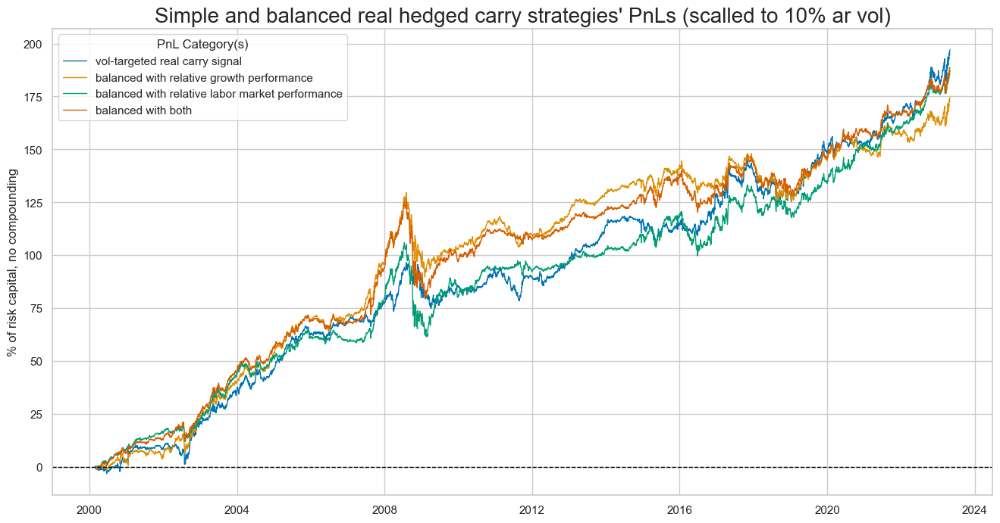

In [58]:
dix = dict_bcrh

sigx = [
    "FXCRRHvGDRB_NSABL5DMZN",
    "CRH_GROWTH_ZNC",
    "CRH_LABOR_ZNC",
    "CRH_ECO_ZNC",
]  # [dix["sig"]] + dix["rivs"]
naive_pnl = dix["pnls"]
pnls = [sig + "_PZN" for sig in sigx]

dict_labels={"FXCRRHvGDRB_NSABL5DMZN_PZN":"vol-targeted real carry signal",
"CRH_GROWTH_ZNC_PZN": "balanced with relative growth performance",
"CRH_LABOR_ZNC_PZN": "balanced with relative labor market performance",
"CRH_ECO_ZNC_PZN": "balanced with both"
}

naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start="2000-01-01",
    title="Simple and balanced real hedged carry strategies' PnLs (scalled to 10% ar vol)",
    xcat_labels=dict_labels,
    figsize=(16, 8),
)

In [59]:
dix = dict_bcrh

sigx = [
    "CRH_GROWTH_ZNC",
    "CRH_LABOR_ZNC",
    "CRH_ECO_ZNC",
    "FXCRRHvGDRB_NSABL5DMZN",
]  # [dix["sig"]] + dix["rivs"]
naive_pnl = dix["pnls"]
pnls = [sig + "_PZN" for sig in sigx]

df_eval = naive_pnl.evaluate_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start="2000-01-01",
)
display(df_eval)

xcat,CRH_ECO_ZNC_PZN,CRH_GROWTH_ZNC_PZN,CRH_LABOR_ZNC_PZN,FXCRRHvGDRB_NSABL5DMZN_PZN
Return (pct ar),8.150934,7.535211,8.075363,8.507911
St. Dev. (pct ar),10.0,10.0,10.0,10.0
Sharpe Ratio,0.815093,0.753521,0.807536,0.850791
Sortino Ratio,1.161224,1.076306,1.152726,1.230493
Max 21-day draw,-27.3179,-20.471036,-27.027449,-14.509827
Max 6-month draw,-40.849852,-34.747645,-37.893412,-17.653845
Traded Months,280,280,280,280
